In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping


INFO:api_somo:Sending request to http://127.0.0.1:8000/database/functions/time-series/filter_date_serie/ with parameters: {'station_name': 'buenaventura', 'variable_name': 'nivel del mar', 'processing_level_name': 'imputados', 'start_date': '2014-01-01', 'end_date': '2017-12-31'}
INFO:api_somo:Original columns: ['date_time', 'sensor_data', 'quality_flag']
INFO:api_somo:Columns after renaming: ['timestamp', 'value', 'qf']
INFO:api_somo:Timestamp conversion and indexing complete.
INFO:__main__:Fetched historical series: Empty DataFrame
Columns: [value, qf]
Index: []


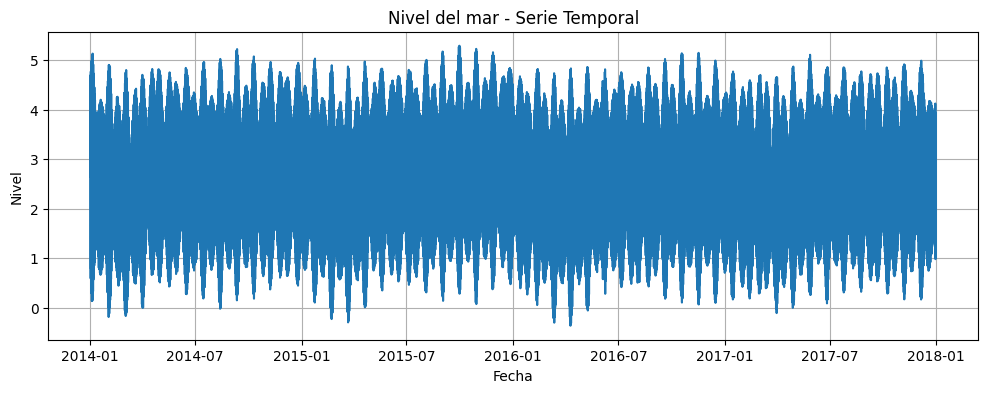

'display(red_mpomm_serie.columns)\ndisplay(round(red_mpomm_serie.describe(),3))'

In [2]:
# Solicitud de datos a la API REST
from api_somo import APIClient, fetch_qf 
import logging

# Setting up logging for the main script
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

api_url = "http://127.0.0.1:8000/database/functions/time-series/filter_date_serie/"
params = {
    "station_name": "buenaventura",
    "variable_name": "nivel del mar",
    "processing_level_name": "imputados",
    "start_date":"2014-01-01",
    "end_date":"2017-12-31"
    }

try:
    # 1. Fetch and process the data
    red_mpomm_serie = APIClient.fetch_and_process_data(api_url, params)

    if red_mpomm_serie.empty:
        raise ValueError("The historical series is empty.")

    # Additional processing with the historical series
    logger.info(f"Fetched historical series: {red_mpomm_serie.head(0)}")

except Exception as e:
    logger.error(f"Error fetching historical series: {e}")

# Visualiza la serie
plt.figure(figsize=(12, 4))
plt.plot(red_mpomm_serie['value'])
plt.title('Nivel del mar - Serie Temporal')
plt.xlabel('Fecha')
plt.ylabel('Nivel')
plt.grid(True)
plt.show()
'''display(red_mpomm_serie.columns)
display(round(red_mpomm_serie.describe(),3))'''

 3. Preprocesamiento y escalado

In [3]:
# Solo usamos la variable de interés
data = red_mpomm_serie[['value']].values

# Normaliza la serie entre 0 y 1
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data)


4. Función para crear secuencias

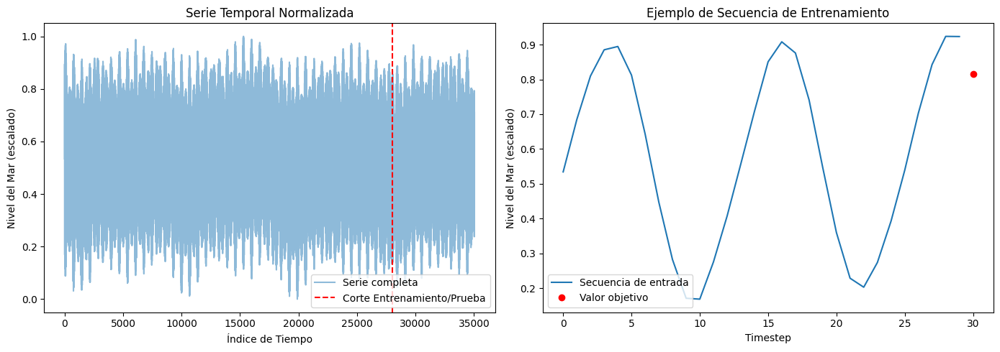

In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Suponiendo que ya tienes `scaled_data` (normalizado) y que es un array 1D tipo numpy
def create_sequences(data, sequence_length=30):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        y.append(data[i+sequence_length])
    return np.array(X), np.array(y)

# Define parámetros
seq_len = 30
split = int(len(scaled_data) * 0.8)

# Divide los datos en entrenamiento y prueba
train_data = scaled_data[:split]
test_data = scaled_data[split - seq_len:]  # solapamiento para crear secuencias válidas

X_train, y_train = create_sequences(train_data, seq_len)
X_test, y_test = create_sequences(test_data, seq_len)

# -------------------
# 📈 Gráficas
# -------------------

plt.figure(figsize=(14, 5))

# 1. Visualización de la serie temporal original con separación
plt.subplot(1, 2, 1)
plt.plot(scaled_data, label='Serie completa', alpha=0.5)
plt.axvline(x=split, color='r', linestyle='--', label='Corte Entrenamiento/Prueba')
plt.title('Serie Temporal Normalizada')
plt.xlabel('Índice de Tiempo')
plt.ylabel('Nivel del Mar (escalado)')
plt.legend()

# 2. Visualización de una secuencia de entrenamiento
plt.subplot(1, 2, 2)
plt.plot(X_train[0], label='Secuencia de entrada')
plt.plot(seq_len, y_train[0], 'ro', label='Valor objetivo')
plt.title('Ejemplo de Secuencia de Entrenamiento')
plt.xlabel('Timestep')
plt.ylabel('Nivel del Mar (escalado)')
plt.legend()

plt.tight_layout()
plt.show()



In [5]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available:  0


 5. Define y entrena el modelo LSTM

In [6]:
model = Sequential()
model.add(LSTM(50, return_sequences=False, input_shape=(seq_len, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

early_stop = EarlyStopping(monitor='val_loss', patience=10)

history = model.fit(
    X_train, y_train,
    validation_split=0.1,
    epochs=10,
    batch_size=16,
    callbacks=[early_stop],
    verbose=1
)


d:\master BigData\01 proyecto final\codigos\venv-tf2\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1576/1576 ━━━━━━━━━━━━━━━━━━━━ 39s 21ms/step - loss: 0.0193 - val_loss: 7.8896e-04
Epoch 2/10
1576/1576 ━━━━━━━━━━━━━━━━━━━━ 18s 12ms/step - loss: 2.9167e-04 - val_loss: 1.1567e-04
Epoch 3/10
1576/1576 ━━━━━━━━━━━━━━━━━━━━ 17s 11ms/step - loss: 1.8960e-04 - val_loss: 1.0479e-04
Epoch 4/10
1576/1576 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step - loss: 1.4839e-04 - val_loss: 1.1554e-04
Epoch 5/10
1576/1576 ━━━━━━━━━━━━━━━━━━━━ 22s 14ms/step - loss: 1.4076e-04 - val_loss: 9.4596e-05
Epoch 6/10
1576/1576 ━━━━━━━━━━━━━━━━━━━━ 17s 11ms/step - loss: 1.2075e-04 - val_loss: 1.6894e-04
Epoch 7/10
1576/1576 ━━━━━━━━━━━━━━━━━━━━ 18s 11ms/step - loss: 1.1646e-04 - val_loss: 1.3209e-04
Epoch 8/10
1576/1576 ━━━━━━━━━━━━━━━━━━━━ 17s 11ms/step - loss: 1.0364e-04 - val_loss: 7.0707e-05
Epoch 9/10
1576/1576 ━━━━━━━━━━━━━━━━━━━━ 17s 11ms/step - loss: 9.2961e-05 - val_loss: 9.0603e-05
Epoch 10/10
1576/1576 ━━━━━━━━━━━━━━━━━━━━ 17s 11ms/step - loss: 8.0255e-05 - val_loss: 7.6978e-05


 6. Gráfica del entrenamiento

In [7]:
import numpy as np
import pandas as pd
from graphics_utils.go import multi_line
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Crear un rango de épocas
epochs = range(1, len(history.history['loss']) + 1)

# Convertir las listas de pérdidas en series de pandas, con un índice de épocas
loss_series = pd.Series(history.history['loss'], index=epochs, name="Pérdida Entrenamiento")
val_loss_series = pd.Series(history.history['val_loss'], index=epochs, name="Pérdida Validación")

# Calcular las métricas de error
mae = mean_absolute_error(loss_series, val_loss_series)  # MAE
rmse = np.sqrt(mean_squared_error(loss_series, val_loss_series))  # RMSE

# Calcular la correlación entre las dos series
correlation = loss_series.corr(val_loss_series)

# Generar gráfico
fig = multi_line(Pérdida_Entrenamiento=loss_series, Pérdida_Validación=val_loss_series)

# Actualizar el título con la correlación y las métricas
fig.update_layout(
    title=f"Comparación de Pérdidas durante el Entrenamiento y Validación\n"
          f"Correlación: {correlation:.2f} | MAE: {mae:.2f} | RMSE: {rmse:.2f}"
)

fig.show()


7. Hacer predicciones y desescalar

In [8]:
predictions = model.predict(X_test)
predicted = scaler.inverse_transform(predictions)
actual = scaler.inverse_transform(y_test.reshape(-1, 1))

220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step


 8. Comparación visual: Real vs Predicción

In [9]:
import pandas as pd
from graphics_utils.go import multi_line

# Aplanar los arrays
actual_series = pd.Series(actual.ravel(), name="Insitu")
predicted_series = pd.Series(predicted.ravel(), name="Prediccion")
display(actual_series)
# Calcular correlación
correlation = actual_series.corr(predicted_series)

# Generar gráfico
fig = multi_line(Insitu=actual_series, Prediccion=predicted_series)

# Actualizar el título con la correlación
fig.update_layout(
    title=f"Comparación de series temporales - Corr: {correlation:.2f}"
)

fig.show()


0       0.7681
1       1.4467
2       2.1653
3       3.0567
4       3.8981
         ...  
7004    1.0985
7005    1.4942
7006    2.1485
7007    2.9285
7008    3.6528
Name: Insitu, Length: 7009, dtype: float64

In [10]:
from statistics_utils.eda.timeseries import test_stationarity
import numpy as np
test_stationarity(red_mpomm_serie['value'])

# Calcular la primera diferenciación
diferenciada = red_mpomm_serie.copy()
diferenciada['value'] = red_mpomm_serie['value'].diff()  # Calcular la diferencia
diferenciada = diferenciada.dropna(subset=['value'])  # Eliminar filas con NaN en 'value'
# Validar que no hay NaN o Inf en la columna 'value'
diferenciada = diferenciada[~diferenciada['value'].isin([np.inf, -np.inf])]  # Eliminar Inf
# Prueba de estacionariedad
test_stationarity(diferenciada['value'])


# Segunda diferenciación (doble diferenciación)
diferenciada_2 = red_mpomm_serie.copy()
diferenciada_2['value'] = diferenciada['value'].diff()
diferenciada_2 = diferenciada_2.dropna(subset=['value'])  # Eliminar filas con NaN en 'value'
# Validar que no hay NaN o Inf en la columna 'value'
diferenciada_2 = diferenciada_2[~diferenciada_2['value'].isin([np.inf, -np.inf])]  # Eliminar Inf
# Prueba de estacionariedad
test_stationarity(diferenciada_2['value'])


Resultados de la Prueba de Dickey-Fuller Aumentada:
Estadístico de Prueba: -3.9061882964504666
Valor P: 0.0019897737328006997
Número de Retardos Usados: 51
Número de Observaciones: 34989
Valores Críticos:
  1%: -3.4305369095948914
  5%: -2.8616226094213086
  10%: -2.5668139703987647

La serie es estacionaria (se rechaza H₀).
Resultados de la Prueba de Dickey-Fuller Aumentada:
Estadístico de Prueba: -35.228981490010284
Valor P: 0.0
Número de Retardos Usados: 52
Número de Observaciones: 34987
Valores Críticos:
  1%: -3.430536920280192
  5%: -2.861622614143799
  10%: -2.5668139729124237

La serie es estacionaria (se rechaza H₀).
Resultados de la Prueba de Dickey-Fuller Aumentada:
Estadístico de Prueba: -46.51367206128618
Valor P: 0.0
Número de Retardos Usados: 52
Número de Observaciones: 34986
Valores Críticos:
  1%: -3.4305369256233007
  5%: -2.8616226165052465
  10%: -2.566813974169361

La serie es estacionaria (se rechaza H₀).


In [11]:
from graphics_utils.express import fig_boxplot, fig_lineplot, fig_pie_month, fig_pie, fig_boxplot_category, fig_histogram
from graphics_utils.go import multi_line, arrange_figures_in_subplots

line = multi_line(Original=red_mpomm_serie['value'], Diferencia1=diferenciada['value'], Diferencia2 = diferenciada_2['value'])
histograma = fig_histogram(red_mpomm_serie, params)
histograma_dif = fig_histogram(diferenciada, params)
histograma_dif2 = fig_histogram(diferenciada_2, params)
figuras_h={
    'line':line,
    'histograma': histograma,
    'histograma_dif':histograma_dif,
    'histograma_dif2':histograma_dif2
}
fig = arrange_figures_in_subplots(list(figuras_h.values()), 2, 2)
fig.show()

In [12]:
from statistics_utils.eda.timeseries import decompose_time_series
decompose_series=decompose_time_series(red_mpomm_serie['value'])
fig=multi_line(estacional=decompose_series['seasonal'], residuo=decompose_series['resid'], tendencia=decompose_series['trend'], ajuste=decompose_series['ajusted_seasonal'])
fig.show()

Frecuencia inferida: h


d:\master BigData\01 proyecto final\codigos\venv-tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency h will be used.

d:\master BigData\01 proyecto final\codigos\venv-tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency h will be used.

d:\master BigData\01 proyecto final\codigos\venv-tf2\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency h will be used.



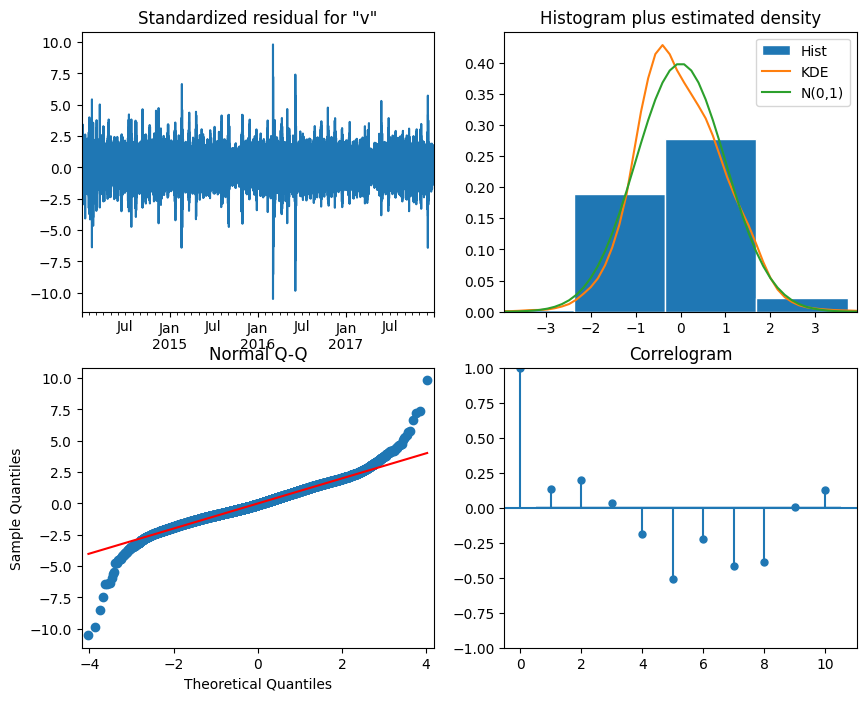

                               SARIMAX Results                                
Dep. Variable:                  value   No. Observations:                35040
Model:                 ARIMA(1, 1, 1)   Log Likelihood               19129.271
Date:                Fri, 25 Apr 2025   AIC                         -38252.541
Time:                        00:29:54   BIC                         -38227.149
Sample:                    01-01-2014   HQIC                        -38244.454
                         - 12-31-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7110      0.004    199.442      0.000       0.704       0.718
ma.L1          0.6307      0.003    201.837      0.000       0.625       0.637
sigma2         0.0196      0.000    163.201      0.0

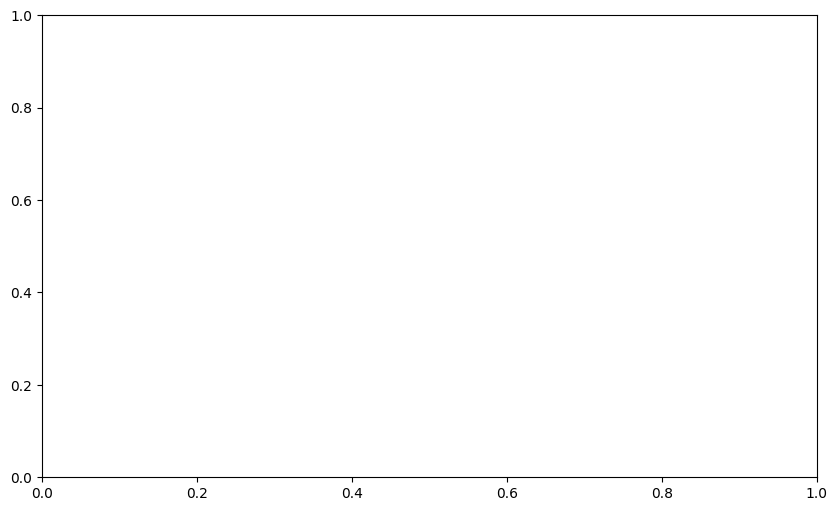

In [13]:
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# Parámetros ARIMA
p = 1
d = 1
q = 1

# Ajustar modelo ARIMA
model = ARIMA(diferenciada['value'], order=(p, d, q))
result = model.fit()

# Graficar diagnóstico
result.plot_diagnostics(figsize=(10, 8))
plt.show()

# Realizar predicciones dentro de la muestra (in-sample)
predictions = result.predict(start=d, end=len(diferenciada['value']) - 1)

# Graficar los datos originales y las predicciones
fig, ax = plt.subplots(figsize=(10, 6))
pred_fig = multi_line(Original=red_mpomm_serie['value'],Entrenamiento= abs(predictions))

pred_fig.show()

# Resumen del modelo
print(result.summary())


In [14]:
def train_val_test_split(serie, tr_size=0.8, vl_size=0.1, ts_size=0.1 ):
    # Definir número de datos en cada subserie
    N = serie.shape[0]
    Ntrain = int(tr_size*N)  # Número de datos de entrenamiento
    Nval = int(vl_size*N)    # Número de datos de validación
    Ntst = N - Ntrain - Nval # Número de datos de prueba

    # Realizar partición
    train = serie[0:Ntrain]
    val = serie[Ntrain:Ntrain+Nval]
    test = serie[Ntrain+Nval:]

    return train, val, test

tr, vl, ts = train_val_test_split(red_mpomm_serie['value'])

# Imprimir en pantalla el tamaño de cada subset
print(f'Tamaño set de entrenamiento: {tr.shape}')
print(f'Tamaño set de validación: {vl.shape}')
print(f'Tamaño set de prueba: {ts.shape}')

Tamaño set de entrenamiento: (28032,)
Tamaño set de validación: (3504,)
Tamaño set de prueba: (3505,)


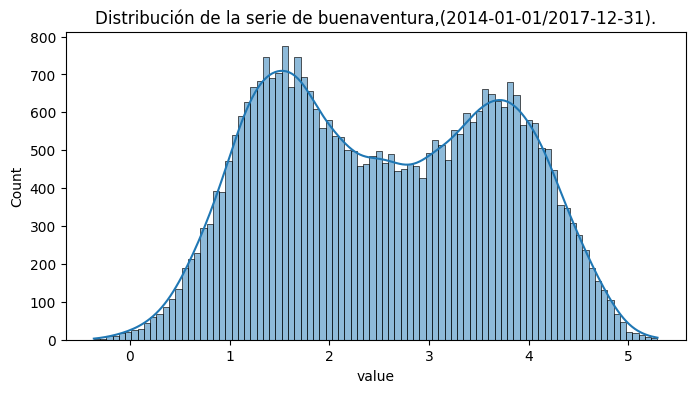

In [15]:
import numpy as np
import seaborn as sns

value_log = np.log1p(red_mpomm_serie['value'])  # log(1 + x) para evitar problemas con valores cercanos a 0

plt.figure(figsize=(8, 4))
sns.histplot(red_mpomm_serie['value'], bins=90, kde=True)
plt.title(f"Distribución de la serie de {params['station_name']},({params['start_date']}/{params['end_date']}).")
plt.show()


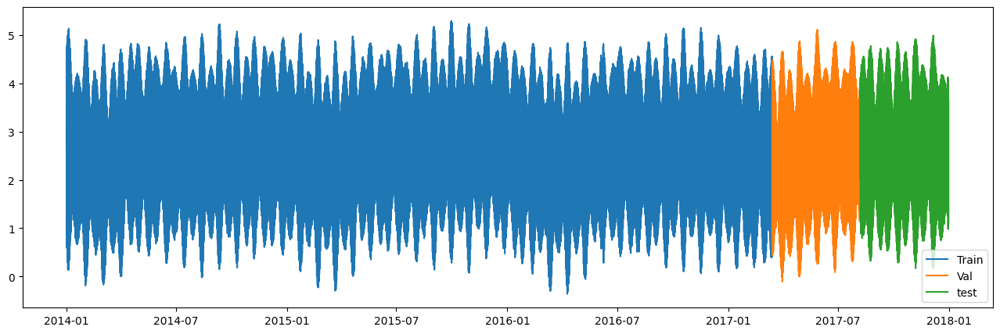

In [16]:
# Dibujar los subsets
from cProfile import label
import matplotlib.pyplot as plt


fig, ax =plt.subplots(figsize = (16,5))
ax.plot(tr, label='Train')
ax.plot(vl, label='Val')
ax.plot(ts, label='test')
plt.legend()

In [17]:
from graphics_utils.express import fig_boxplot
boxplot_fig = fig_boxplot(red_mpomm_serie, params, color='month')
boxplot_fig.show()